### Model: Dale-CB-STP model


In [28]:
# Model Training

'Data Preprocessing'
import torch
import math
import numpy as np

# Device configuration
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
print("Using device:", device)

# get index of currently selected device
print(torch.cuda.current_device()) # returns 0 in my case

# get number of GPUs available
print(torch.cuda.device_count()) # returns 1 in my case

# get the name of the device
print(torch.cuda.get_device_name(0)) # good old Tesla K80

def snake_scan(img):
    'Converts a 32x32 image to a 32x96 array with snake-like row ordering'
    if len(img.shape) != 3:
        raise ValueError('Input image must be a 3D array')
    
    channels, rows, cols = img.shape
    snake = np.zeros((rows, cols * channels), dtype=img.dtype)
    for r in range(rows):
        row_data = img[:, r, :].flatten()  # Flattening each row into a 1D array of 96 elements
        if r % 2 == 1:
            row_data = row_data[::-1]  # Reversing the order for alternate rows
        snake[r] = row_data
    return snake

def stride(input_data, stride):
    'turn [batch_size, sequence_length, input_size] into [batch_size, sequence_length*input_size/stride, input_size]'
    batch_size, sequence_length, input_size = input_data.shape
    # flatten the input data to put sequence and input size together
    input_data = input_data.reshape(batch_size, -1)
    # append zeros to make sure the last pixel can be fed as the first pixel of the next sequence
    n = input_size - (sequence_length*input_size)%stride

    input_data = input_data.cpu()
    input_data = input_data.numpy()
    input_data = np.append(input_data, np.zeros((batch_size, n)), axis=1)
    input_data = torch.tensor(input_data)
    #print(input_data.shape)
    output_data = torch.zeros(batch_size, sequence_length*input_size//stride, input_size)
    for i in range(sequence_length*input_size//stride):
        # if stride = input size, then the output data is the same as input data
        #print(i)

        output_data[:,i,:] = input_data[:,i*stride:i*stride+input_size]
        #print(output_data[batch,i,:])

    return output_data

from torchvision import datasets
from torchvision import transforms
from torchvision.transforms import ToTensor
from torchvision.transforms import Lambda

transform = transforms.Compose([
    ToTensor(),
    Lambda(lambda x: torch.tensor(snake_scan(x.numpy())))
])

train_data = datasets.MNIST(
    root = 'data',
    train = True,                         
    download = True,
    transform = transform     
)
test_data = datasets.MNIST(
    root = 'data', 
    train = False, 
    download = True,
    transform = transform
)




'Hyperparameters'
from torch import nn
import torch.nn.functional as F

input_size = 8
sequence_length = 28*28//input_size
hidden_size = 48
num_layers = 1
num_classes = 10
batch_size = 40
num_epochs = 10
learning_rate = 0.01
stride_number = 4

from torch.utils.data import DataLoader
loaders = {
    'train' : torch.utils.data.DataLoader(train_data, 
                                          batch_size=batch_size, 
                                          shuffle=True, 
                                          num_workers=0),
    
    'test'  : torch.utils.data.DataLoader(test_data, 
                                          batch_size=batch_size, 
                                          shuffle=False, 
                                          num_workers=0),
}
loaders
'''
for i, (images, labels) in enumerate(loaders['train']):
    images = images.reshape(-1, sequence_length, input_size).to(device)
    images = stride(images, stride_number).to(device)
    print(images.shape)
    print(labels.shape)
    print(len(loaders['train']))
    break
'''

'Model Definition'

class Dale_CB_STPcell(nn.Module):
    def __init__(self, input_size, hidden_size, num_layers):
        super(Dale_CB_STPcell, self).__init__()
        self.hidden_size = hidden_size
    
        ### Parameters ###
        # voltage gate v_t 
        self.P = torch.nn.Parameter(torch.empty(self.hidden_size, input_size))           
        self.b_v = torch.nn.Parameter(torch.zeros(self.hidden_size, 1))   

        # Update gate z_t
        # K and W are unbounded free parameters   
        # C represents  current based portion of connectivity       
        while True:
            self.K = torch.nn.Parameter(self.init_dale(self.hidden_size, self.hidden_size))
            self.C = torch.nn.Parameter(self.init_dale(self.hidden_size, self.hidden_size))
            nse_K = self.NSE(self.K)
            nse_C = self.NSE(self.C)
            if nse_K > 0.87 and nse_C > 0.87:
                break
        self.P_z = torch.nn.Parameter(torch.empty(self.hidden_size, input_size))
        self.b_z = torch.nn.Parameter(torch.empty(self.hidden_size, 1))   
        # Potentials are initialised with right signs
        self.e_e = torch.nn.Parameter(torch.rand(1))
        self.e_i = torch.nn.Parameter(-torch.rand(1))

        # Firing rate, Scaling factor and time step initialization
        self.v_t = torch.zeros(1, self.hidden_size, dtype=torch.float32)

        # dt is a constant
        self.dt = nn.Parameter(torch.tensor(1.0), requires_grad = False)
        self.z_high = nn.Parameter(torch.repeat_interleave(torch.tensor(0.2), self.hidden_size).reshape(self.hidden_size,1), requires_grad = False)
        self.z_low = torch.nn.Parameter(torch.zeros(self.hidden_size, 1, dtype=torch.float32), requires_grad = False)
        self.z_low[self.hidden_size//2:,:] = 0.1

        ### Nonlinear functions ###
        self.sigmoid = nn.Sigmoid()
        self.softplus = nn.Softplus()
        self.relu = nn.ReLU()

        ### Initialisation ###
        glorot_init = lambda w: nn.init.uniform_(w, a=-(1/math.sqrt(hidden_size)), b=(1/math.sqrt(hidden_size)))
        positive_glorot_init = lambda w: nn.init.uniform_(w, a=0, b=(1/math.sqrt(hidden_size)))

        # initialise matrices
        # P and P_z are unconstrained
        for w in self.P_z, self.P:
            glorot_init(w)
        for w in self.K, self.C:
            positive_glorot_init(w)
        # init b_z to be log 1/99
        nn.init.constant_(self.b_z, torch.log(torch.tensor(1/99)))

        ### STP Model ###
        self.delta_t = 1
        self.z_min = 0.001
        self.z_max = 0.1

        # Short term Depression parameters  
        self.c_x = torch.nn.Parameter(torch.rand(self.hidden_size, 1))

        # Short term Facilitation parameters
        self.c_u = torch.nn.Parameter(torch.rand(self.hidden_size, 1))
        self.c_U = torch.nn.Parameter(torch.rand(self.hidden_size, 1))
        
        # State initialisations
        self.X = torch.ones(self.hidden_size, 1, dtype=torch.float32).to(device)
        self.U = torch.full((self.hidden_size, 1), 0.9, dtype=torch.float32).to(device)
        self.Ucap = 0.9 * self.sigmoid(self.c_U)
        self.Ucapclone = self.Ucap.clone().detach() 

        self.X_history = []
        self.U_history = []
        self.v_t_history = []
        self.z_t_history = []

    def init_dale(self, rows, cols):
        # Dale's law with equal excitatory and inhibitory neurons
        exci = torch.empty((rows, cols//2)).exponential_(1.0)
        inhi = -torch.empty((rows, cols//2)).exponential_(1.0)
        weights = torch.cat((exci, inhi), dim=1)
        weights = self.adjust_spectral(weights)
        return weights

    def adjust_spectral(self, weights, desired_radius=1.5):
        values= torch.linalg.svdvals(weights)
        radius = values.abs().max()
        return weights * (desired_radius / radius)
    
    def NSE(self, weights):
        values = torch.linalg.svdvals(weights)
        normalised_v = values/sum(values)
        H = -1/torch.log(torch.tensor(self.hidden_size)) * torch.sum(normalised_v * torch.log(normalised_v))
        print(H)
        return H

    @property
    def r_t(self):
        return self.sigmoid(self.v_t)

    def forward(self, x):        
        if self.v_t.dim() == 3:           
            self.v_t = self.v_t[0]
        self.v_t = torch.transpose(self.v_t, 0, 1)

        ### Constraints###
        K = self.softplus(self.K)
        C = self.softplus(self.C)
        # W is constructed using e*(K+C)
        # first half of neurons are excitatory and second half are inhibitory
        W_E = self.e_e * (K[:, :self.hidden_size//2] + C[:, :self.hidden_size//2])
        W_I = self.e_i * (K[:, self.hidden_size//2:] + C[:, self.hidden_size//2:])
        # print to see which device the tensor is on
        # If sign of W do not obey Dale's law, then these terms to be 0
        W_E = self.relu(W_E)
        W_I = -self.relu(-W_I)
        W = torch.cat((W_E, W_I), 1)
        self.W = W

        ### STP model ###
        x = torch.transpose(x, 0, 1)
        
        # Short term Depression 
        self.z_x = self.z_min + (self.z_max - self.z_min) * self.sigmoid(self.c_x)
        self.X = self.z_x + torch.mul((1 - self.z_x), self.X) - self.delta_t * self.U * self.X * self.r_t

        # Short term Facilitation 
        self.z_u = self.z_min + (self.z_max - self.z_min) * self.sigmoid(self.c_u)    
        self.Ucap = 0.9 * self.sigmoid(self.c_U)
        self.U = self.Ucap * self.z_u + torch.mul((1 - self.z_u), self.U) + self.delta_t * self.Ucap * (1 - self.U) * self.r_t
        self.Ucapclone = self.Ucap.clone().detach()
        self.U = torch.clamp(self.U, min=self.Ucapclone.repeat(1, x.size(0)).to(device), max=torch.ones_like(self.Ucapclone.repeat(1, x.size(0)).to(device)))
        x = torch.transpose(x, 0, 1)


        ### Update Equations ###
        self.z_t = torch.zeros(self.hidden_size, 1)
        self.z_t = self.dt*self.z_low + self.dt * (self.z_high - self.z_low)*self.sigmoid(torch.matmul(K , self.r_t) + torch.matmul(self.P_z, x) + self.b_z)
        
        # input mask
        # we want this to be orthogonal to the E/I split, so zero out half of excitatory neurons and half of inhibitory neurons
        input_mask = torch.ones_like(self.P)
        input_mask[self.hidden_size//4:self.hidden_size//2,:] = 0
        input_mask[3*self.hidden_size//4:,:] = 0
        P = self.P * input_mask

        self.v_t = (1 - self.z_t) * self.v_t + self.dt * (torch.matmul(W, self.U*self.X*self.r_t) + torch.matmul(P, x) + self.b_v)
        self.v_t = torch.transpose(self.v_t, 0, 1)      
        excitatory = self.v_t[:, :self.hidden_size//2]
        self.excitatory = torch.cat((excitatory, torch.zeros_like(excitatory)), 1)    

        self.X_history.append(self.X.clone().detach())
        self.U_history.append(self.U.clone().detach())
        self.v_t_history.append(self.v_t.clone().detach())
        self.z_t_history.append(self.z_t.clone().detach())   


class Dale_CB_STP_batch(nn.Module):
    def __init__(self, input_size, hidden_size, num_layers, batch_first=True):
        super(Dale_CB_STP_batch, self).__init__()
        self.rnncell = Dale_CB_STPcell(input_size, hidden_size, num_layers).to(device)
        self.batch_first = batch_first

    def forward(self, x):
        if self.batch_first == True:
            for n in range(x.size(1)):
                #print(x.shape)
                x_slice = torch.transpose(x[:,n,:], 0, 1)
                self.rnncell(x_slice)
        return self.rnncell.excitatory            
            
class Dale_CB_STP(nn.Module):
    
    def __init__(self, input_size, hidden_size, num_layers, num_classes):
        super(Dale_CB_STP, self).__init__()
        self.hidden_size = hidden_size
        self.num_layers = num_layers
        self.lstm = Dale_CB_STP_batch(input_size, hidden_size, num_layers)
        self.fc = nn.Linear(hidden_size, 10)
        pass

    def forward(self, x):
        # Set initial hidden and cell states 
        self.lstm.rnncell.X = torch.ones(self.hidden_size, x.size(0), dtype=torch.float32).to(device)
        self.lstm.rnncell.U = (self.lstm.rnncell.Ucapclone.repeat(1, x.size(0))).to(device)
        self.lstm.rnncell.v_t = torch.zeros(self.num_layers, x.size(0), self.hidden_size).to(device) 
        # Passing in the input and hidden state into the model and  obtaining outputs
        out = self.lstm(x)  # out: tensor of shape (batch_size, hidden_size)
        output_mask = torch.ones_like(out)
        output_mask[:,:self.hidden_size//4] = 0
        output_mask[:,3*self.hidden_size//4:] = 0        
        out = out * output_mask

        #Reshaping the outputs such that it can be fit into the fully connected layer
        out = self.fc(out)
        return out.squeeze(-1)
        
        pass                                    
pass

model = Dale_CB_STP(input_size, hidden_size, num_layers, num_classes).to(device)
print(model)
loss_func = nn.CrossEntropyLoss()

'Trajactory Tracking and Training'
from torch import optim
model_optimizer = optim.Adam(model.parameters(), lr = learning_rate)   

from torch.utils.data import DataLoader, Subset
from sklearn.model_selection import StratifiedShuffleSplit

def subset_loader(full_dataset, batch_size, subset_ratio=0.1):
    # Generate labels array to use in stratified split
    labels = []
    for _, label in full_dataset:
        labels.append(label)
    labels = np.array(labels)

    # Perform a stratified shuffle split
    sss = StratifiedShuffleSplit(n_splits=1, test_size=subset_ratio, random_state=0)
    for train_index, test_index in sss.split(np.zeros(len(labels)), labels):
        stratified_subset_indices = test_index

    # Create a Subset instance with the stratified subset indices
    stratified_subset = Subset(full_dataset, stratified_subset_indices)

    # Create DataLoader from the subset
    subset_loader = DataLoader(
        stratified_subset,
        batch_size=batch_size,
        shuffle=False  # No need to shuffle as we already have a random subset
    )

    return subset_loader
subtest = subset_loader(test_data, batch_size)

def evaluate_while_training(model, loaders):
    model.eval()
    correct = 0
    total = 0
    with torch.no_grad():
        for images, labels in subtest:
            images = images.reshape(-1, sequence_length, input_size).to(device)
            images = stride(images, stride_number).to(device)
            labels = labels.to(device)
            outputs = model(images)
            _, predicted = torch.max(outputs.data, 1)
            total += labels.size(0)
            correct += (predicted == labels).sum().item()

    return 100 * correct / total

def train(num_epochs, model, loaders, patience=2, min_delta=0.01):
    model.train()
    total_step = len(loaders['train'])
    train_acc = []
    best_acc = 0
    no_improve_epochs = 0

    for epoch in range(num_epochs):
        for i, (images, labels) in enumerate(loaders['train']):
            images = images.reshape(-1, sequence_length, input_size).to(device)
            images = stride(images, stride_number).to(device)
            labels = labels.to(device)
            model.train()
            # Forward pass
            outputs = model(images)
            loss = loss_func(outputs, labels)

            # Backward and optimize
            model_optimizer.zero_grad()
            loss.backward()
            model_optimizer.step()
            
            if (i+1) % 750 == 0:
                accuracy = evaluate_while_training(model, loaders)
                train_acc.append(accuracy)
                print('Epoch [{}/{}], Step [{}/{}], Training Accuracy: {:.2f}' 
                      .format(epoch + 1, num_epochs, i + 1, total_step, accuracy))

                # Check for improvement
                if accuracy - best_acc > min_delta:
                    best_acc = accuracy
                    no_improve_epochs = 0
                else:
                    no_improve_epochs += 1

                if no_improve_epochs >= patience:
                    print("No improvement in validation accuracy for {} epochs. Stopping training.".format(patience))
                    return train_acc

    return train_acc

train_acc = train(num_epochs, model, loaders)

Using device: cuda
0
1
NVIDIA GeForce RTX 4070 Laptop GPU
tensor(0.9005, grad_fn=<MulBackward0>)
tensor(0.9038, grad_fn=<MulBackward0>)
Dale_CB_STP(
  (lstm): Dale_CB_STP_batch(
    (rnncell): Dale_CB_STPcell(
      (sigmoid): Sigmoid()
      (softplus): Softplus(beta=1, threshold=20)
      (relu): ReLU()
    )
  )
  (fc): Linear(in_features=48, out_features=10, bias=True)
)
Epoch [1/10], Step [750/1500], Training Accuracy: 24.70
Epoch [1/10], Step [1500/1500], Training Accuracy: 40.50
Epoch [2/10], Step [750/1500], Training Accuracy: 51.40
Epoch [2/10], Step [1500/1500], Training Accuracy: 53.40


OutOfMemoryError: CUDA out of memory. Tried to allocate 2.00 MiB (GPU 0; 8.00 GiB total capacity; 21.98 GiB already allocated; 0 bytes free; 22.36 GiB reserved in total by PyTorch) If reserved memory is >> allocated memory try setting max_split_size_mb to avoid fragmentation.  See documentation for Memory Management and PYTORCH_CUDA_ALLOC_CONF

In [29]:
'Testing Accuracy'
# Test the model
model.eval()
X_history = []
U_history = []
v_t_history = []
z_t_history = []
labelslist = []

with torch.no_grad():
    total_loss = 0
    correct = 0
    total = 0
    for images, labels in loaders['test']:
        model.lstm.rnncell.X_history = []
        model.lstm.rnncell.U_history = []
        model.lstm.rnncell.v_t_history = []
        model.lstm.rnncell.z_t_history = []
        images = images.reshape(-1, sequence_length, input_size).to(device)
        images = stride(images, stride_number).to(device)
        labels = labels.to(device)
        outputs = model(images)
        _, predicted = torch.max(outputs.data, 1)
        total += labels.size(0)
        correct += (predicted ==labels).sum().item()
        X_history.append(model.lstm.rnncell.X_history)
        U_history.append(model.lstm.rnncell.U_history)
        v_t_history.append(model.lstm.rnncell.v_t_history)
        z_t_history.append(model.lstm.rnncell.z_t_history)
        labelslist.append(labels)

test_acc = 100 * correct / total
print('Accuracy of the model:{}%'.format(test_acc))

# Retrieve weights
P = model.lstm.rnncell.P.detach().cpu().numpy()
W = model.lstm.rnncell.W.detach().cpu().numpy()
read_out = model.fc.weight.detach().cpu().numpy()


# Retrieve Ucap, z_u, z_x
Ucap = model.lstm.rnncell.Ucap
z_u = model.lstm.rnncell.z_u
z_x = model.lstm.rnncell.z_x



#Accuracy of the model:55.56% (doubled neurons)

Accuracy of the model:55.56%


In [30]:
# save histories and parameters
import pickle
with open('08_history.pkl', 'wb') as f:
    pickle.dump(X_history, f)
    pickle.dump(U_history, f)
    pickle.dump(v_t_history, f)
    pickle.dump(z_t_history, f)
    pickle.dump(labelslist, f)
    pickle.dump(P, f)
    pickle.dump(W, f)
    pickle.dump(read_out, f)
    pickle.dump(Ucap, f)
    pickle.dump(z_u, f)
    pickle.dump(z_x, f)
    pickle.dump(test_acc, f) 

In [3]:
# load histories
import pickle
with open('08_history.pkl', 'rb') as f:
    X_history = pickle.load(f)
    U_history = pickle.load(f)
    v_t_history = pickle.load(f)
    z_t_history = pickle.load(f)
    labelslist = pickle.load(f)
    P = pickle.load(f)
    W = pickle.load(f)
    read_out = pickle.load(f)
    Ucap = pickle.load(f)
    z_u = pickle.load(f)
    z_x = pickle.load(f)
    test_acc = pickle.load(f)

### Preprocessing

In [4]:
def convert_history(history_list):
    concatenated_history = []
    for batch in history_list:
        # Convert each tensor in the batch to numpy and append to a new list
        batch_history = [tensor.cpu().numpy() for tensor in batch]
        # Stack along a new dimension to keep batch data separate
        concatenated_history.append(np.stack(batch_history))
    # Concatenate all the batch data along the first dimension
    return np.concatenate(concatenated_history, axis=0)


def average_image(X_history, labelslist):

    neuronimage = []
    labelslist_array = convert_history(labelslist)
    order= np.argsort(labelslist_array.flatten())
    labelslist_array = labelslist_array.flatten()[order]
    # find number of 0, 1, 2, 3, 4, 5, 6, 7, 8, 9
    _, counts = np.unique(labelslist_array, return_counts=True)
    X  = convert_history(X_history)
    X = X.reshape((250, 196, 48, 40))
    X = X.transpose(0, 3, 1, 2)
    X = X.reshape((10000, 196, 48))
    k=0
    for i in range(10):
        X_label = X[k:k+counts[i],:,:]
        X_label = X_label.mean(axis=0)
        neuronimage.append(X_label)
        k += counts[i]
    neuronimage = np.array(neuronimage)
    return neuronimage

def average_image_v(X_history, labelslist):

    neuronimage = []
    labelslist_array = convert_history(labelslist)
    order= np.argsort(labelslist_array.flatten())
    labelslist_array = labelslist_array.flatten()[order]
    # find number of 0, 1, 2, 3, 4, 5, 6, 7, 8, 9
    _, counts = np.unique(labelslist_array, return_counts=True)
    X  = convert_history(X_history)
    X = X.transpose(0, 2, 1)
    X = X.reshape((250, 196, 48, 40))
    X = X.transpose(0, 3, 1, 2)
    X = X.reshape((10000, 196, 48))
    k=0
    for i in range(10):
        X_label = X[k:k+counts[i],:,:]
        X_label = X_label.mean(axis=0)
        neuronimage.append(X_label)
        k += counts[i]
    neuronimage = np.array(neuronimage)
    return neuronimage


In [4]:
%matplotlib ipympl

In [5]:
import matplotlib.pyplot as plt
import numpy as np
import matplotlib.colors as mcolors

X_nit = average_image(X_history, labelslist)
U_nit = average_image(U_history, labelslist)
v_nit = average_image_v(v_t_history, labelslist)
z_nit = average_image(z_t_history, labelslist)


In [ ]:
from matplotlib.widgets import Slider

import mpl_interactions.ipyplot as iplt


In [ ]:
import matplotlib.pyplot as plt
import matplotlib.colors as mcolors
print(X_nit.shape)
print(U_nit.shape)
plt.figure()
for i in range(12):
    plt.scatter(X_nit[0, :, i], U_nit[0, :, i], c=np.arange(196), cmap='viridis', alpha=0.5)
plt.colorbar()
plt.xlabel('X')
plt.ylabel('U')
plt.show()

for i in range(12):
    plt.scatter(X_nit[0, :, i+12], U_nit[0, :, i+12], c=np.arange(196), cmap='viridis', alpha=0.5)
plt.colorbar()
plt.xlabel('X')
plt.ylabel('U')
plt.show()

plt.figure()
plt.scatter(v_nit[0, :, 0], z_nit[0, :, 0], c=range(196), cmap='viridis', alpha=0.5)
plt.colorbar()
plt.xlabel('v_t')
plt.ylabel('z_t')
plt.show()

plt.figure()
plt.scatter(v_nit[0, :, 0], U_nit[0, :, 0], c=range(196), cmap='viridis', alpha=0.5)
plt.colorbar()
plt.xlabel('v_t')
plt.ylabel('U')
plt.show()

plt.figure()
plt.scatter(X_nit[0, :, 0], z_nit[0, :, 0], c=range(196), cmap='viridis', alpha=0.5)
plt.colorbar()
plt.xlabel('X')
plt.ylabel('z_t')
plt.show()



In [127]:
# generate (24,10,4) histograms
# divide time into 4 parts, ta -- time averaged
def timeaverage(X_nit):
    X_nit= X_nit.transpose(2, 0, 1)
    X_ta = X_nit.reshape(48, 10, 4, 196//4).mean(axis=-1)
    X_ta_ei = X_ta[:12, :, :]
    X_ta_eo = X_ta[12:24, :, :]
    X_ta_ii = X_ta[24:36, :, :]
    X_ta_io = X_ta[36:, :, :]
    return X_ta_ei, X_ta_eo, X_ta_ii, X_ta_io

X_ta_ei, X_ta_eo, X_ta_ii, X_ta_io = timeaverage(X_nit)
U_ta_ei, U_ta_eo, U_ta_ii, U_ta_io = timeaverage(U_nit)
v_ta_ei, v_ta_eo, v_ta_ii, v_ta_io = timeaverage(v_nit)
z_ta_ei, z_ta_eo, z_ta_ii, z_ta_io = timeaverage(z_nit)
# plot the histograms

def timeaverage_ei(X_nit):
    X_nit= X_nit.transpose(2, 0, 1)
    X_ta = X_nit.reshape(48, 10, 4, 196//4).mean(axis=-1)
    X_ta_e = X_ta[:24, :, :]
    X_ta_i = X_ta[24:, :, :]
    return X_ta_e, X_ta_i

def timeaverage_io(X_nit):
    X_nit= X_nit.transpose(2, 0, 1)
    X_ta = X_nit.reshape(48, 10, 4, 196//4).mean(axis=-1)
    X_ta_ei = X_ta[:12, :, :]
    X_ta_eo = X_ta[12:24, :, :]
    X_ta_ii = X_ta[24:36, :, :]
    X_ta_io = X_ta[36:, :, :]
    X_ta_i = np.concatenate((X_ta_ei, X_ta_ii), axis=0)
    X_ta_o = np.concatenate((X_ta_eo, X_ta_io), axis=0)
    return X_ta_i, X_ta_o

### Superposed Histogram

In [7]:
input_size = 8
sequence_length = 28*28//input_size
hidden_size = 24
num_layers = 1
num_classes = 10
batch_size = 40
num_epochs = 5
learning_rate = 0.01
stride_number = 4

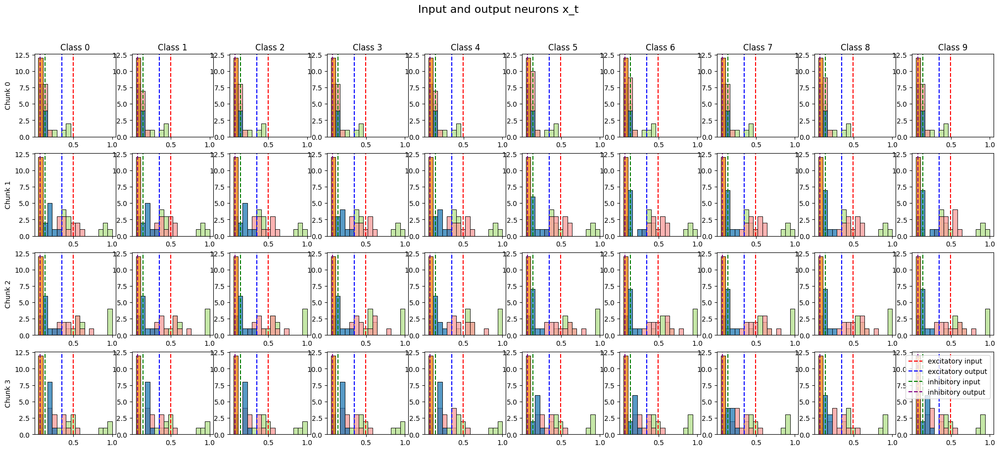

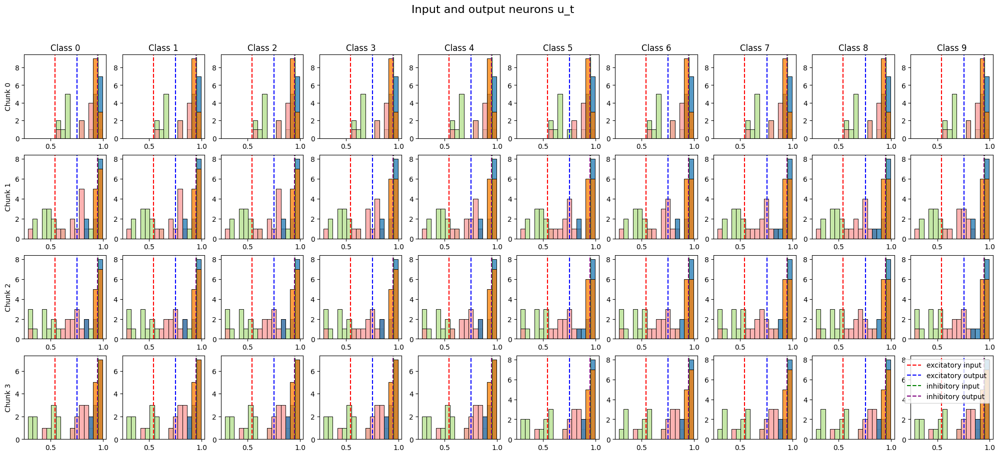

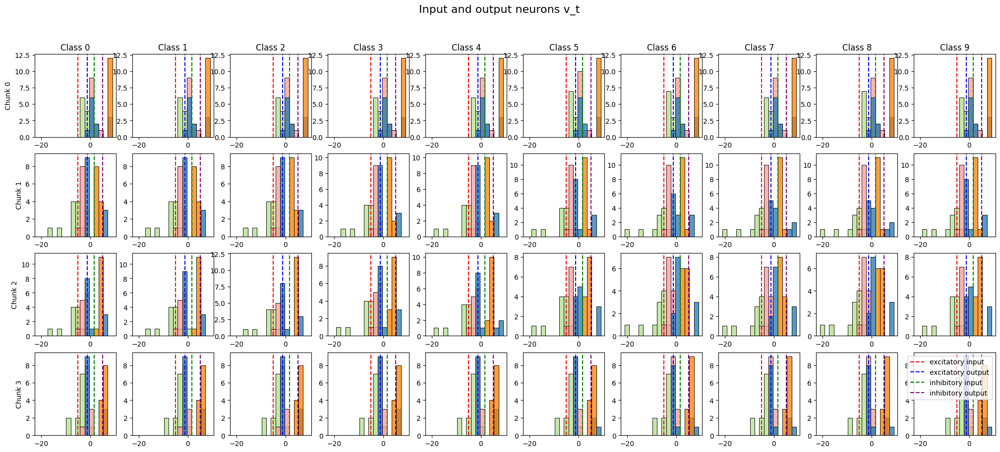

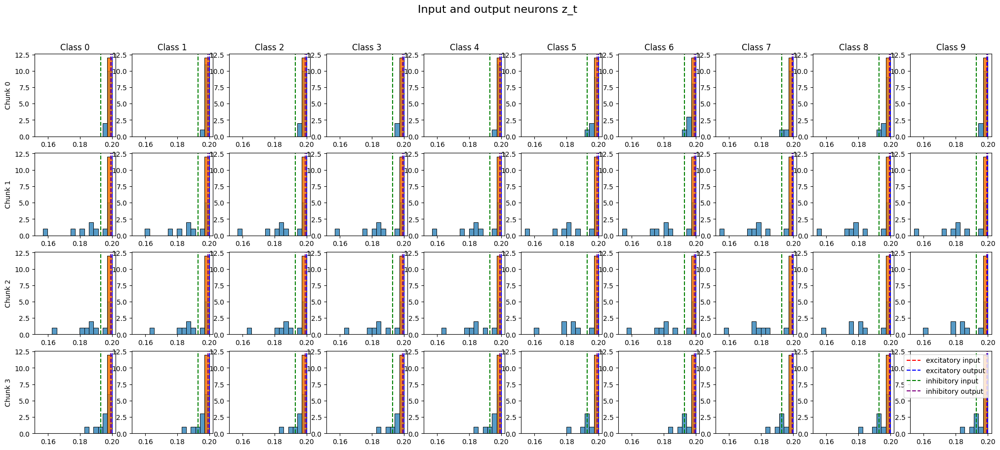

In [139]:
import seaborn as sns
pal = sns.color_palette("Paired", 8)
ei = pal[2]
eo = pal[4]
ii = pal[1]
io = pal[7]

def hist_io(X_ta_ei, X_ta_eo, X_ta_ii, X_ta_io, y):
    fig, axs = plt.subplots(4, 10, figsize=(25, 10))
    # use seaborn to plot histograms
    all_data = np.concatenate([X_ta_ei.flatten(), X_ta_eo.flatten(), X_ta_ii.flatten(), X_ta_io.flatten()])
    bin_range = (all_data.min(), all_data.max())
    import seaborn as sns
    for i in range(10):
        for j in range(4):
            ax = axs[j, i]
            
            sns.histplot(X_ta_ei[:,i, j], ax=ax, bins = 16, color=ei, binrange=bin_range)
            sns.histplot(X_ta_eo[:,i, j], ax=ax, bins = 16, color=eo, binrange=bin_range)
            sns.histplot(X_ta_ii[:,i, j], ax=ax, bins = 16, color=ii, binrange=bin_range)
            sns.histplot(X_ta_io[:,i, j], ax=ax, bins = 16, color=io, binrange=bin_range)
            plt.legend(['excitatory input', 'excitatory output', 'inhibitory input', 'inhibitory output'], loc='lower left')
            ax.axvline(X_ta_ei.mean(), color='r', linestyle='--')
            ax.axvline(X_ta_eo.mean(), color='b', linestyle='--')
            ax.axvline(X_ta_ii.mean(), color='g', linestyle='--')
            ax.axvline(X_ta_io.mean(), color='purple', linestyle='--')

            plt.legend(['excitatory input', 'excitatory output', 'inhibitory input', 'inhibitory output'], loc='upper right')
            # set title for first row
            if j == 0:
                ax.set_title(f'Class {i}')
            # set y label for first column
            if i == 0:
                ax.set_ylabel(f'Chunk {j}')
            # remove y label for other columns
            else:
                ax.set_ylabel('')
    fig.suptitle(f'Input and output neurons {y}', fontsize=16)
    plt.show()
    return fig
fig_x = hist_io(X_ta_ei, X_ta_eo, X_ta_ii, X_ta_io, r'x_t')
fig_u = hist_io(U_ta_ei, U_ta_eo, U_ta_ii, U_ta_io, r'u_t')
fig_v = hist_io(v_ta_ei, v_ta_eo, v_ta_ii, v_ta_io, r'v_t')
fig_z = hist_io(z_ta_ei, z_ta_eo, z_ta_ii, z_ta_io, r'z_t')


# generate same figures for other 3 variables


# Save in PDF
from matplotlib.backends.backend_pdf import PdfPages
with PdfPages('1.1_histograms_08.pdf') as pdf:
    # Text page with parameters
    text_page = plt.figure(figsize=(8, 10))
    text_page.clf()  # Clear the figure
    text_content = f"""
    Superposed Histogram of Input and Output Neurons of Dynamic Variables

    Parameters:
    Input Size: {input_size}
    Sequence Length: {sequence_length}
    Hidden Size: {hidden_size}
    Number of Layers: {num_layers}
    Number of Classes: {num_classes}
    Batch Size: {batch_size}
    Number of Epochs: {num_epochs}
    Learning Rate: {learning_rate}
    Stride Number: {stride_number}
    """
    text_page.text(0.5, 0.5, text_content, ha='center', va='center', fontsize=12)
    pdf.savefig(text_page)
    plt.close(text_page)

    # Save figures
    for fig in [fig_x, fig_u, fig_v, fig_z]:
        pdf.savefig(fig)
        plt.close(fig)



### Scatter plots of dynamic variables

In [59]:
def timeaverage_whole(X_nit):
    X_nit= X_nit.transpose(2, 0, 1)
    X_ta = X_nit.reshape(48, 10, 4, 196//4).mean(axis=-1)

    return X_ta

def time_imageaverage(X_nit):
    X_nit= X_nit.transpose(2, 0, 1)
    X_ta = X_nit.reshape(48, 10, 4, 196//4).mean(axis=-1)
    X_ta_ei = X_ta[:12, :, :]
    X_ta_eo = X_ta[12:24, :, :]
    X_ta_ii = X_ta[24:36, :, :]
    X_ta_io = X_ta[36:, :, :]
    X_ta_ei = X_ta_ei.mean(axis=1)
    X_ta_eo = X_ta_eo.mean(axis=1)
    X_ta_ii = X_ta_ii.mean(axis=1)
    X_ta_io = X_ta_io.mean(axis=1)
    return X_ta_ei, X_ta_eo, X_ta_ii, X_ta_io

In [61]:
import pandas as pd
def datasets(a, b, c, d, time):
    a = a[:, time]
    b = b[:, time]
    c = c[:, time]
    d = d[:, time]
    data = np.hstack((a.flatten(), b.flatten(), c.flatten(), d.flatten()))
    labels = ['exicitatory input', 'exicitatory output', 'inhibitory input', 'inhibitory output']
    label = np.repeat(labels, len(a))
    df = pd.DataFrame({'data': data, 'label': label})
    return df

def all_datasets(xa, xb, xc, xd, ua, ub, uc, ud, va, vb, vc, vd, za, zb, zc, zd, time):
    # combine 4 datasets together with a label 

    x = np.hstack((xa[:, time].flatten(), xb[:, time].flatten(), xc[:, time].flatten(), xd[:, time].flatten()))
    u = np.hstack((ua[:, time].flatten(), ub[:, time].flatten(), uc[:, time].flatten(), ud[:, time].flatten()))
    v = np.hstack((va[:, time].flatten(), vb[:, time].flatten(), vc[:, time].flatten(), vd[:, time].flatten()))
    z = np.hstack((za[:, time].flatten(), zb[:, time].flatten(), zc[:, time].flatten(), zd[:, time].flatten()))

    labels = ['exicitatory input', 'exicitatory output', 'inhibitory input', 'inhibitory output']
    label = np.repeat(labels, len(xa))
    df = pd.DataFrame({'x': x, 'u': u, 'v': v, 'z': z, 'label':label})

    return df

In [66]:
X_ta_ei, X_ta_eo, X_ta_ii, X_ta_io = time_imageaverage(X_nit)
U_ta_ei, U_ta_eo, U_ta_ii, U_ta_io = time_imageaverage(U_nit)
v_ta_ei, v_ta_eo, v_ta_ii, v_ta_io = time_imageaverage(v_nit)
z_ta_ei, z_ta_eo, z_ta_ii, z_ta_io = time_imageaverage(z_nit)


In [132]:
# plot histograms of Ucap, z_u, z_x
fig, axs = plt.subplots(2, 2, figsize=(10, 10))
fig.suptitle('Histogram of Ucap, z_u, z_x', fontsize=16)

# Ucap
sns.histplot(Ucap, ax=axs[0, 0], bins=16, color = ei)

# label its mean on the plot
axs[0, 0].axvline(Ucap[:12].mean(), color='r', linestyle='--')
axs[0, 0].axvline(Ucap[12:24].mean(), color='b', linestyle='--')
axs[0, 0].axvline(Ucap[24:36].mean(), color='g', linestyle='--')
axs[0, 0].axvline(Ucap[36:].mean(), color='y', linestyle='--')
# label the mean lines
axs[0, 0].text(Ucap[:12].mean(), 6, 'EI ', rotation=0, verticalalignment='bottom', horizontalalignment='right')
axs[0, 0].text(Ucap[12:24].mean(), 7, 'EO ', rotation=0, verticalalignment='bottom', horizontalalignment='right')
axs[0, 0].text(Ucap[24:36].mean(), 7, 'II ', rotation=0, verticalalignment='bottom', horizontalalignment='right')
axs[0, 0].text(Ucap[36:].mean(), 6, 'IO ', rotation=0, verticalalignment='bottom', horizontalalignment='right')
axs[0, 0].set_title('Ucap')

# z_u
sns.histplot(z_u, ax=axs[0, 1], bins=16)
axs[0, 1].axvline(z_u[:12].mean(), color='r', linestyle='--')
axs[0, 1].axvline(z_u[12:24].mean(), color='b', linestyle='--')
axs[0, 1].axvline(z_u[24:36].mean(), color='g', linestyle='--')
axs[0, 1].axvline(z_u[36:].mean(), color='y', linestyle='--')
axs[0, 1].text(z_u[:12].mean(), 6, 'EI ', rotation=0, verticalalignment='bottom', horizontalalignment='right')
axs[0, 1].text(z_u[12:24].mean(), 7, 'EO ', rotation=0, verticalalignment='bottom', horizontalalignment='right')
axs[0, 1].text(z_u[24:36].mean(), 7, 'II ', rotation=0, verticalalignment='bottom', horizontalalignment='right')
axs[0, 1].text(z_u[36:].mean(), 6, 'IO ', rotation=0, verticalalignment='bottom', horizontalalignment='right')

axs[0, 1].set_title('z_u')
# z_x
sns.histplot(z_x, ax=axs[1, 0], bins=16)
axs[1, 0].axvline(z_x[:12].mean(), color='r', linestyle='--')
axs[1, 0].axvline(z_x[12:24].mean(), color='b', linestyle='--')
axs[1, 0].axvline(z_x[24:36].mean(), color='g', linestyle='--')
axs[1, 0].axvline(z_x[36:].mean(), color='y', linestyle='--')
axs[1, 0].text(z_x[:12].mean(), 6, 'EI ', rotation=0, verticalalignment='bottom', horizontalalignment='right')
axs[1, 0].text(z_x[12:24].mean(), 7, 'EO ', rotation=0, verticalalignment='bottom', horizontalalignment='right')
axs[1, 0].text(z_x[24:36].mean(), 7, 'II ', rotation=0, verticalalignment='bottom', horizontalalignment='right')
axs[1, 0].text(z_x[36:].mean(), 6, 'IO ', rotation=0, verticalalignment='bottom', horizontalalignment='right')

axs[1, 0].set_title('z_x')


with PdfPages('1.1_historgrampara_08.pdf') as pdf:
    # Text page with parameters
    text_page = plt.figure(figsize=(8, 10))
    text_page.clf()  # Clear the figure
    text_content = f"""
    Histogram of STP Parameters

    Parameters:
    Input Size: {input_size}
    Sequence Length: {sequence_length}
    Hidden Size: {hidden_size}
    Number of Layers: {num_layers}
    Number of Classes: {num_classes}
    Batch Size: {batch_size}
    Number of Epochs: {num_epochs}
    Learning Rate: {learning_rate}
    Stride Number: {stride_number}
    """
    text_page.text(0.5, 0.5, text_content, ha='center', va='center', fontsize=12)
    pdf.savefig(text_page)
    plt.close(text_page)

    # Save the scatter plots

    pdf.savefig(fig)
    plt.close(fig)

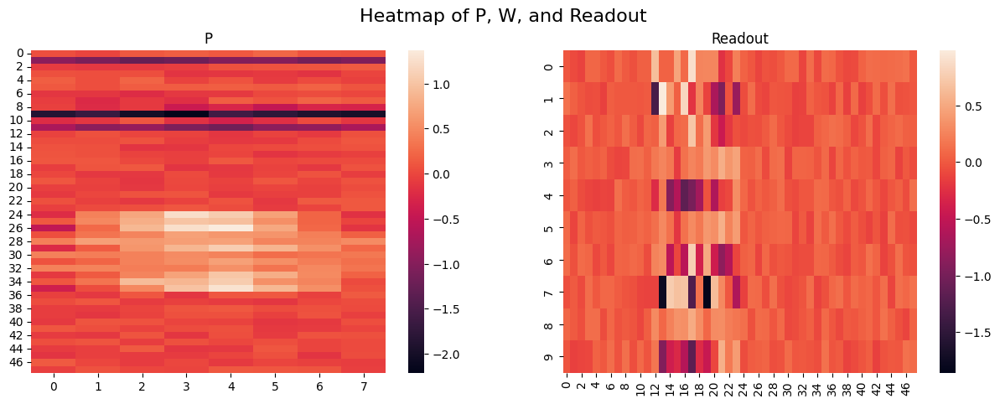

In [141]:
# Plot heatmap of P
fig, axs = plt.subplots(1, 2, figsize=(15, 5))
fig.suptitle('Heatmap of P, W, and Readout', fontsize=16)

sns.heatmap(P, ax=axs[0])
axs[0].set_title('P')


# Plot heatmap of readout
sns.heatmap(read_out, ax=axs[1])
axs[1].set_title('Readout')

plt.show()


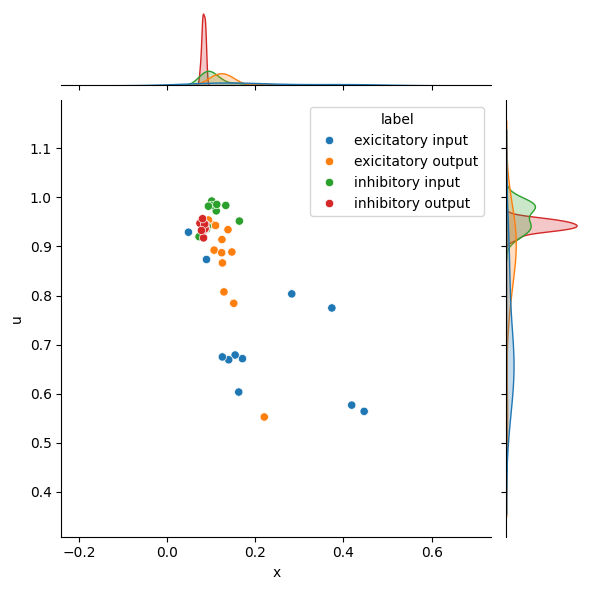

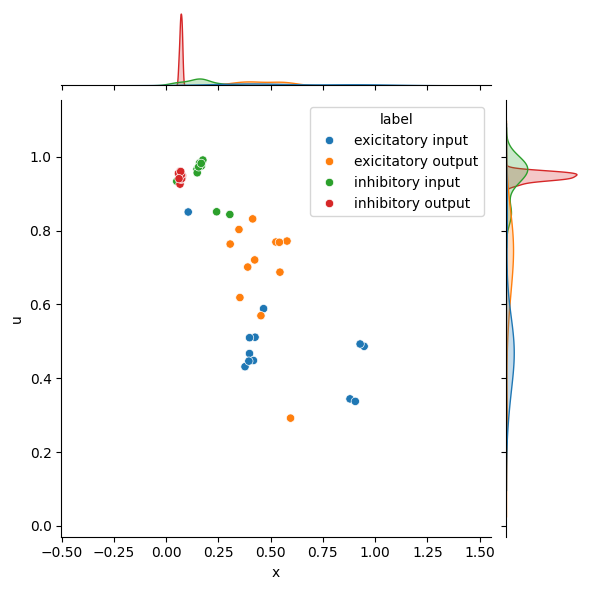

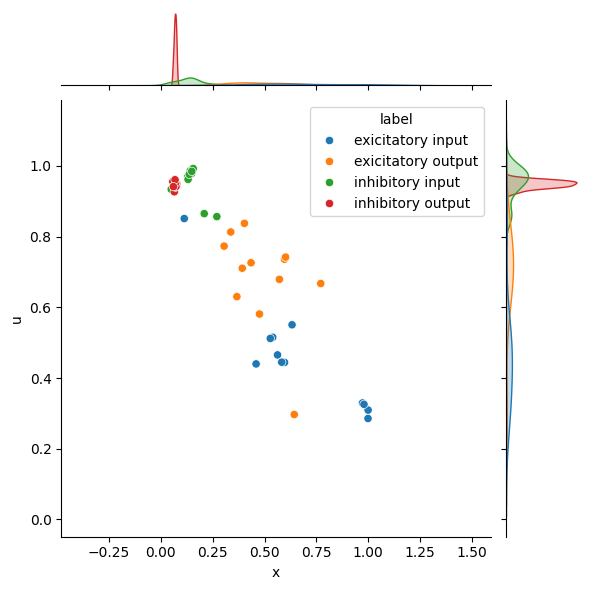

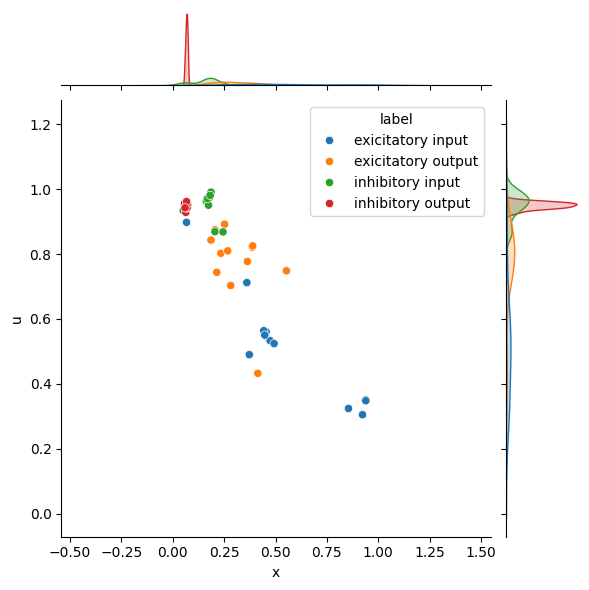

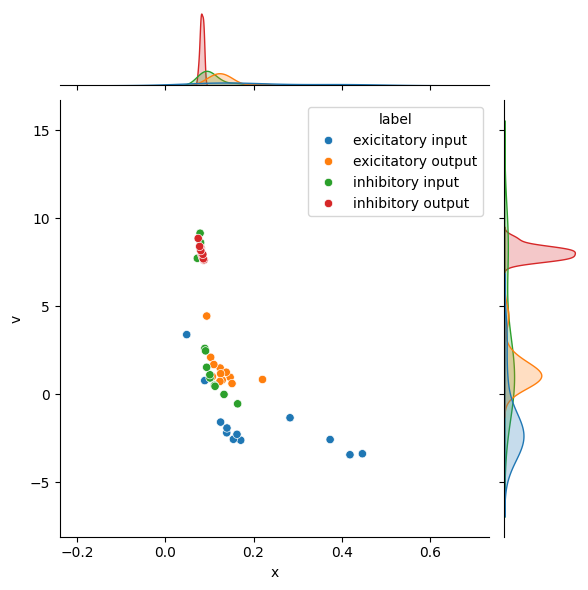

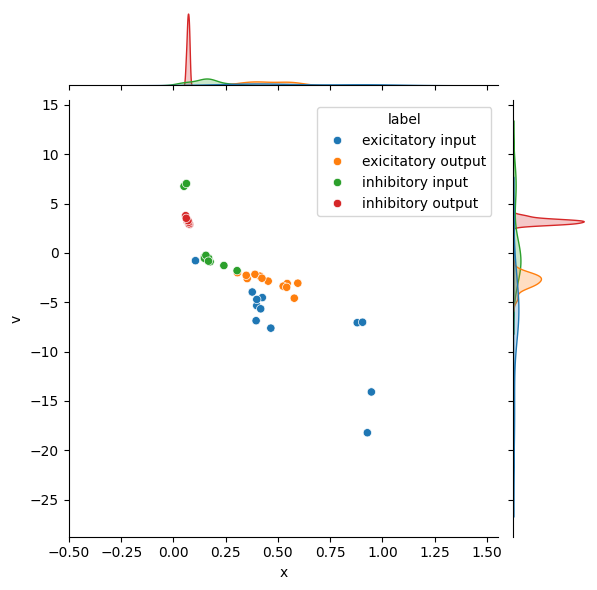

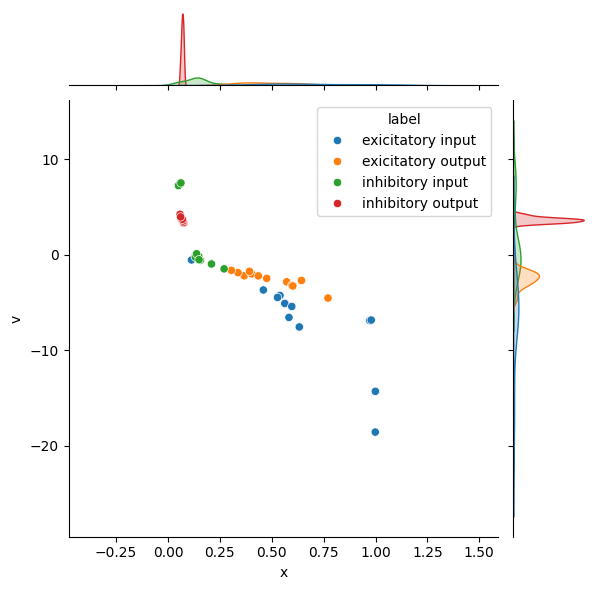

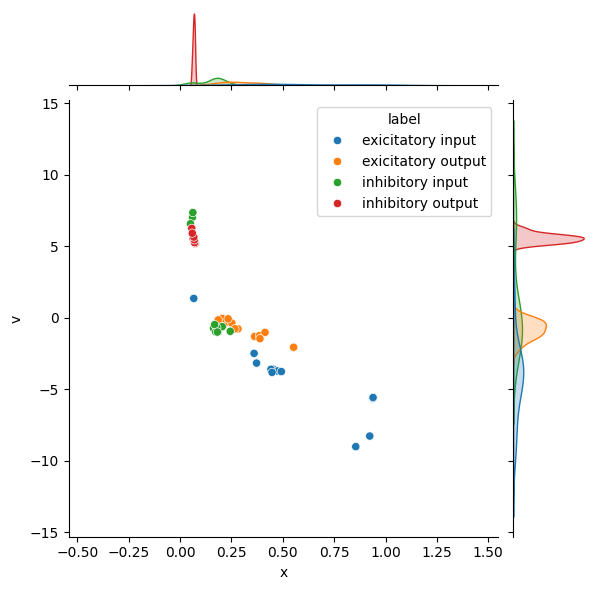

In [65]:
# plot for 4 different time chunks

data1 = all_datasets(X_ta_ei, X_ta_eo, X_ta_ii, X_ta_io, U_ta_ei, U_ta_eo, U_ta_ii, U_ta_io, v_ta_ei, v_ta_eo, v_ta_ii, v_ta_io, z_ta_ei, z_ta_eo, z_ta_ii, z_ta_io, 0)
data2 = all_datasets(X_ta_ei, X_ta_eo, X_ta_ii, X_ta_io, U_ta_ei, U_ta_eo, U_ta_ii, U_ta_io, v_ta_ei, v_ta_eo, v_ta_ii, v_ta_io, z_ta_ei, z_ta_eo, z_ta_ii, z_ta_io, 1)
data3 = all_datasets(X_ta_ei, X_ta_eo, X_ta_ii, X_ta_io, U_ta_ei, U_ta_eo, U_ta_ii, U_ta_io, v_ta_ei, v_ta_eo, v_ta_ii, v_ta_io, z_ta_ei, z_ta_eo, z_ta_ii, z_ta_io, 2)
data4 = all_datasets(X_ta_ei, X_ta_eo, X_ta_ii, X_ta_io, U_ta_ei, U_ta_eo, U_ta_ii, U_ta_io, v_ta_ei, v_ta_eo, v_ta_ii, v_ta_io, z_ta_ei, z_ta_eo, z_ta_ii, z_ta_io, 3)


sns.jointplot(data=data1, x='x', y='u', hue='label')
sns.jointplot(data=data2, x='x', y='u', hue='label')
sns.jointplot(data=data3, x='x', y='u', hue='label')
sns.jointplot(data=data4, x='x', y='u', hue='label')

with PdfPages('1.1_jointplot_08.pdf') as pdf:
    # Text page with parameters
    text_page = plt.figure(figsize=(8, 10))
    text_page.clf()  # Clear the figure
    text_content = f"""
    Superposed Histogram of Input and Output Neurons of Dynamic Variables

    Parameters:
    Input Size: {input_size}
    Sequence Length: {sequence_length}
    Hidden Size: {hidden_size}
    Number of Layers: {num_layers}
    Number of Classes: {num_classes}
    Batch Size: {batch_size}
    Number of Epochs: {num_epochs}
    Learning Rate: {learning_rate}
    Stride Number: {stride_number}
    """
    text_page.text(0.5, 0.5, text_content, ha='center', va='center', fontsize=12)
    pdf.savefig(text_page)
    plt.close(text_page)

    # Save the scatter plots
    for fig in [fig_xu, fig_xz, fig_xv, fig_uz]:
        pdf.savefig(fig)
        plt.close(fig)

In [ ]:
import matplotlib.pyplot as plt
import seaborn as sns
from matplotlib.backends.backend_pdf import PdfPages

pal = sns.color_palette("Paired", 8)
ei = pal[2]
eo = pal[4]
ii = pal[1]
io = pal[7]
# Assuming the data arrays (X_ta_input, X_ta_output, etc.) are already defined

def scat_io(X_ta, U_ta, x, y):
    fig, axs = plt.subplots(4, 10, figsize=(25, 8))  # Adjust the grid size if needed
    pal = sns.color_palette("Paired", 8)
    ic = pal[1]  # Input color
    oc = pal[4]  # Output color
    
    for i in range(10):  # Adjust range if you want a 4x4 grid
        for j in range(4):
            ax = axs[j, i]
            
            # Plotting input neurons
            ax.jointplot(X_ta[:, i, j], U_ta[:, i, j], kind='scatter', color=ei, ax=ax, marginal_kws=dict(bins=16))
            
            if j == 0:
                ax.set_title(f'Class {i}')
            if i == 0:
                ax.set_ylabel(f'Chunk {j}')
            else:
                ax.set_ylabel('')
                
            # Adding legend to only the first subplot for clarity
            if i == 0 and j == 0:
                ax.legend()
    
    fig.suptitle(f'Input and Output Neurons Scatter Plot for {x} and {y}', fontsize=16)
    fig.supxlabel(f'{x}')
    fig.supylabel(f'{y}')
    plt.show()

    return fig

# put X_ta_ei, X_ta_eo, U_ta_ei, U_ta_eo to datasets of seaborn with labels
# put the datasets to scatter plot

# Example usage of the function with dummy data
# fig_x = scat_io(X_ta_input, X_ta_output, U_ta_input, U_ta_output, y=r'$x_t$')
fig_xu = scat_io(X_ta_ei, X_ta_eo, U_ta_ei, U_ta_eo, x=r'$x_t$', y=r'$u_t$')
fig_xz = scat_io(X_ta_ei, X_ta_eo, v_ta_ei, v_ta_eo, x=r'$x_t$', y=r'$v_t$')
fig_xv = scat_io(U_ta_ei, U_ta_eo, z_ta_ei, z_ta_eo, x=r'$u_t$', y=r'$z_t$')
fig_vu = scat_io(v_ta_ei, v_ta_eo, U_ta_ei, U_ta_eo, x=r'$v_t$', y=r'$u_t$')
fig_vz = scat_io(v_ta_ei, v_ta_eo, z_ta_ei, z_ta_eo, x=r'$v_t$', y=r'$z_t$')
fig_uz = scat_io(U_ta_ei, U_ta_eo, z_ta_ei, z_ta_eo, x=r'$u_t$', y=r'$z_t$')



# Save the figures in PDF
with PdfPages('1.1_jointplot_08.pdf') as pdf:
    # Text page with parameters
    text_page = plt.figure(figsize=(8, 10))
    text_page.clf()  # Clear the figure
    text_content = f"""
    Superposed Histogram of Input and Output Neurons of Dynamic Variables

    Parameters:
    Input Size: {input_size}
    Sequence Length: {sequence_length}
    Hidden Size: {hidden_size}
    Number of Layers: {num_layers}
    Number of Classes: {num_classes}
    Batch Size: {batch_size}
    Number of Epochs: {num_epochs}
    Learning Rate: {learning_rate}
    Stride Number: {stride_number}
    """
    text_page.text(0.5, 0.5, text_content, ha='center', va='center', fontsize=12)
    pdf.savefig(text_page)
    plt.close(text_page)

    # Save the scatter plots
    for fig in [fig_xu, fig_xz, fig_xv, fig_uz]:
        pdf.savefig(fig)
        plt.close(fig)


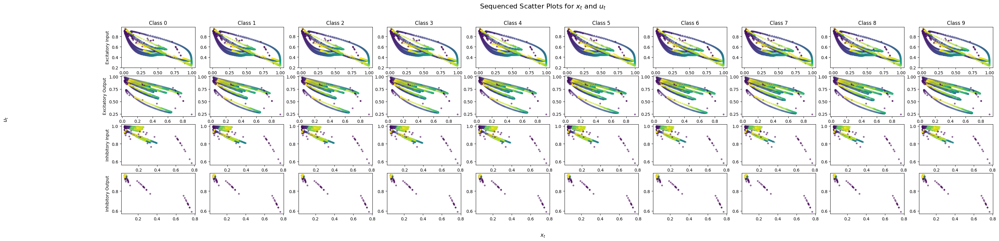

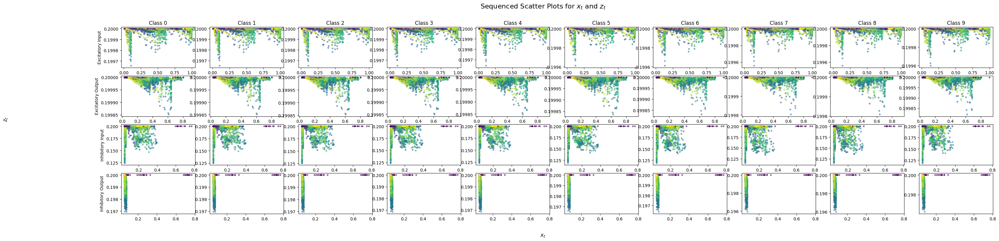

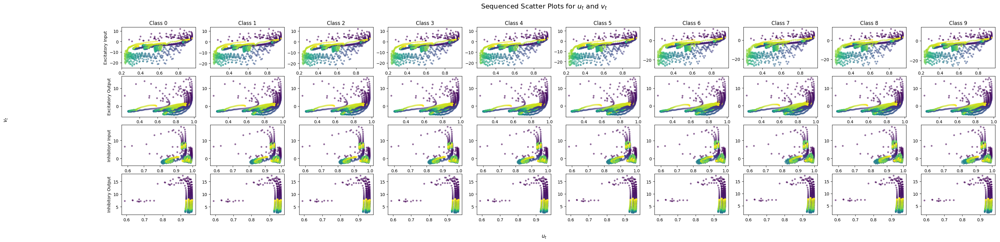

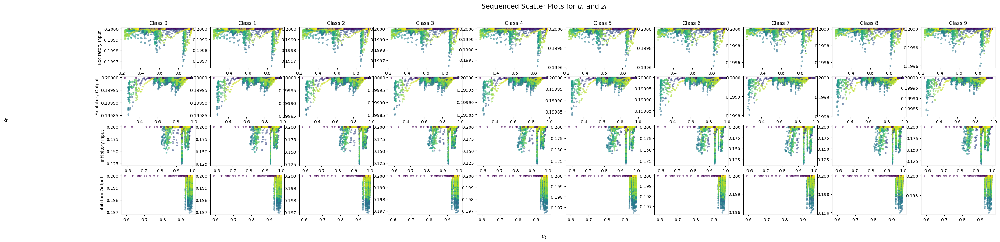

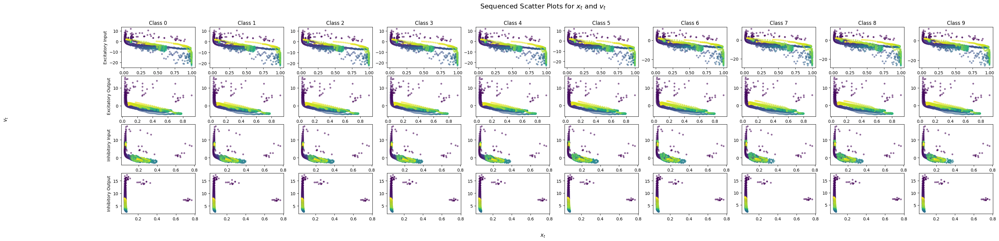

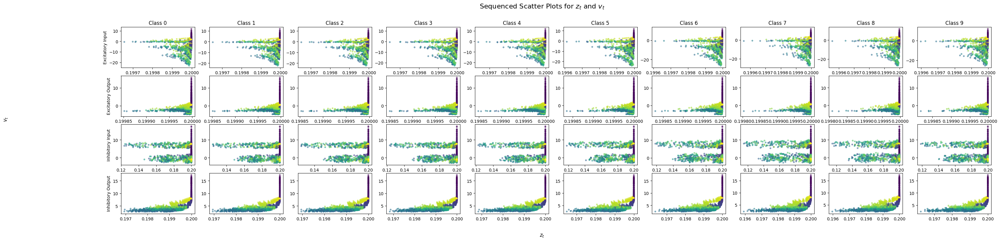

In [25]:
# X_nit (10, 196, 24)
def seqscat_io(X_nit, U_nit, x, y):
    fig, axs = plt.subplots(4, 10, figsize=(37, 8))  # Adjust the grid size if needed

    for i in range(10):  # Adjust range if you want a 4x4 grid
        for j in range(4):
            ax = axs[j, i]
            
            for k in range(12):
                ax.scatter(X_nit[i, :, k+j*12], U_nit[i,:,k+j*12], s = 10, alpha=0.5, c = np.arange(196), cmap = 'viridis')     
                       
            if j == 0:
                ax.set_title(f'Class {i}')
            if i == 0 and j == 0:
                ax.set_ylabel('Excitatory Input')
            elif i == 0 and j == 1:
                ax.set_ylabel('Excitatory Output')
            elif i == 0 and j == 2:
                ax.set_ylabel('Inhibitory Input')
            elif i == 0 and j == 3:
                ax.set_ylabel('Inhibitory Output')
            else:
                ax.set_ylabel('')
    
    fig.suptitle(f'Sequenced Scatter Plots for {x} and {y}', fontsize=16)
    fig.supxlabel(f'{x}')
    fig.supylabel(f'{y}')
    plt.show()
    return fig

# all 6 combinations
fig_xu = seqscat_io(X_nit, U_nit, x=r'$x_t$', y=r'$u_t$')
fig_xz = seqscat_io(X_nit, z_nit, x=r'$x_t$', y=r'$z_t$')
fig_uv = seqscat_io(U_nit, v_nit, x=r'$u_t$', y=r'$v_t$')
fig_uz = seqscat_io(U_nit, z_nit, x=r'$u_t$', y=r'$z_t$')
fig_xv = seqscat_io(X_nit, v_nit, x=r'$x_t$', y=r'$v_t$')
fig_zv = seqscat_io(z_nit, v_nit, x=r'$z_t$', y=r'$v_t$')




# Save the figures in PDF
from matplotlib.backends.backend_pdf import PdfPages
with PdfPages('1.3_seqscat_fourclass07.pdf') as pdf:
    # Text page with parameters
    text_page = plt.figure(figsize=(8, 10))
    text_page.clf()  # Clear the figure
    text_content = f"""
    Superposed Histogram of Input and Output Neurons of Dynamic Variables

    Parameters:
    Input Size: {input_size}
    Sequence Length: {sequence_length}
    Hidden Size: {hidden_size}
    Number of Layers: {num_layers}
    Number of Classes: {num_classes}
    Batch Size: {batch_size}
    Number of Epochs: {num_epochs}
    Learning Rate: {learning_rate}
    Stride Number: {stride_number}
    """
    text_page.text(0.5, 0.5, text_content, ha='center', va='center', fontsize=12)
    pdf.savefig(text_page)
    plt.close(text_page)

    # Save the scatter plots
    for fig in [fig_xu, fig_xz, fig_uv, fig_uz, fig_xv, fig_zv]:
        pdf.savefig(fig)
        plt.close(fig)

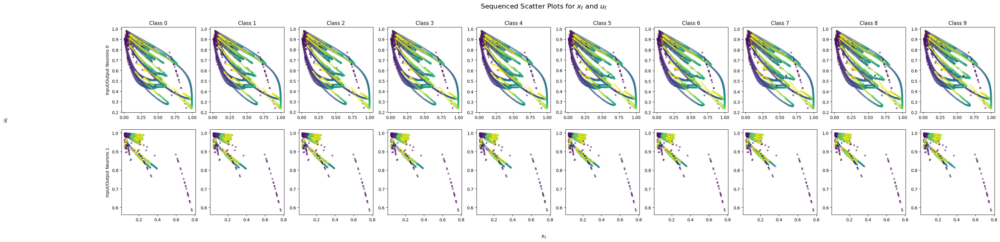

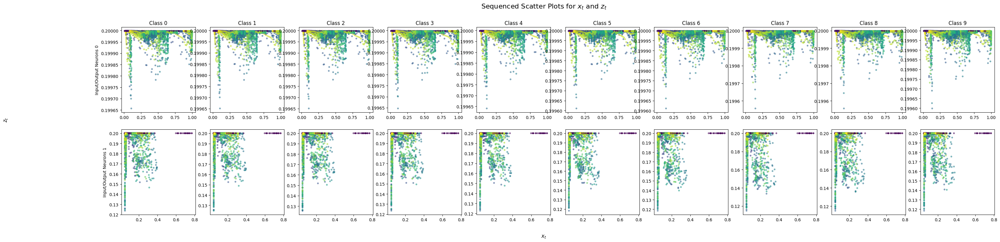

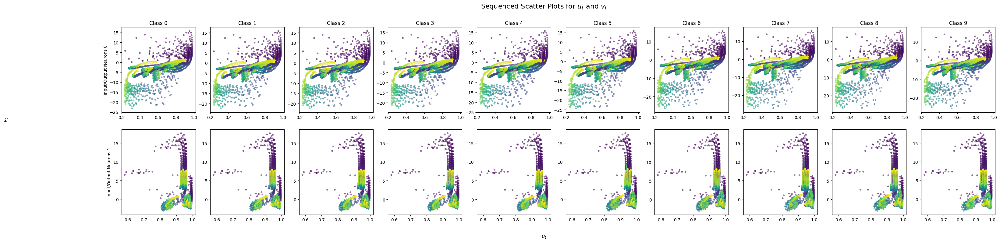

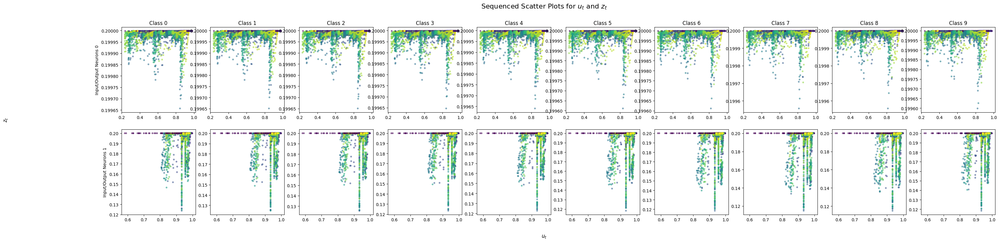

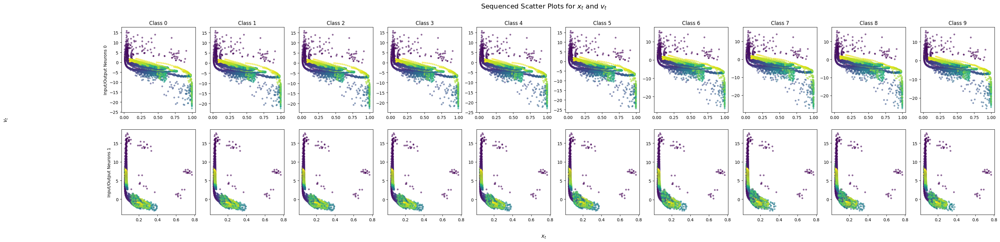

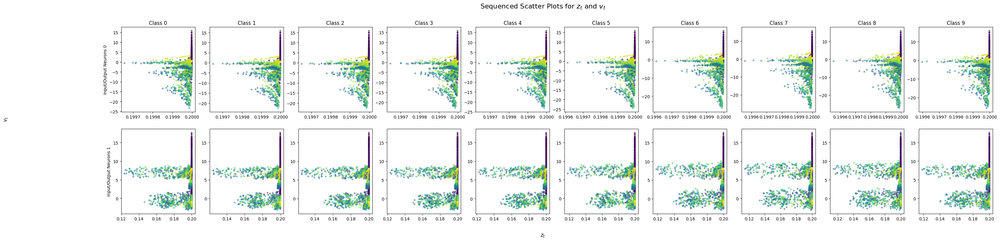

In [21]:
# X_nit (10, 196, 24)
def seqscat_io(X_nit, U_nit, x, y):
    fig, axs = plt.subplots(2, 10, figsize=(37, 8))  # Adjust the grid size if needed

    for i in range(10):  # Adjust range if you want a 4x4 grid
        for j in range(2):
            ax = axs[j, i]
            
            for k in range(24):
                ax.scatter(X_nit[i, :, k+j*24], U_nit[i,:,k+j*24], s = 10, alpha=0.5, c = np.arange(196), cmap = 'viridis')     
                       
            if j == 0:
                ax.set_title(f'Class {i}')
            if i == 0:
                ax.set_ylabel(f'Input/Output Neurons {j}')
            else:
                ax.set_ylabel('')
    
    fig.suptitle(f'Sequenced Scatter Plots for {x} and {y}', fontsize=16)
    fig.supxlabel(f'{x}')
    fig.supylabel(f'{y}')
    plt.show()
    return fig

# all 6 combinations
fig_xu = seqscat_io(X_nit, U_nit, x=r'$x_t$', y=r'$u_t$')
fig_xz = seqscat_io(X_nit, z_nit, x=r'$x_t$', y=r'$z_t$')
fig_uv = seqscat_io(U_nit, v_nit, x=r'$u_t$', y=r'$v_t$')
fig_uz = seqscat_io(U_nit, z_nit, x=r'$u_t$', y=r'$z_t$')
fig_xv = seqscat_io(X_nit, v_nit, x=r'$x_t$', y=r'$v_t$')
fig_zv = seqscat_io(z_nit, v_nit, x=r'$z_t$', y=r'$v_t$')




# Save the figures in PDF
from matplotlib.backends.backend_pdf import PdfPages
with PdfPages('1.3_seqscat_ei_07.pdf') as pdf:
    # Text page with parameters
    text_page = plt.figure(figsize=(8, 10))
    text_page.clf()  # Clear the figure
    text_content = f"""
    Superposed Histogram of Input and Output Neurons of Dynamic Variables

    Parameters:
    Input Size: {input_size}
    Sequence Length: {sequence_length}
    Hidden Size: {hidden_size}
    Number of Layers: {num_layers}
    Number of Classes: {num_classes}
    Batch Size: {batch_size}
    Number of Epochs: {num_epochs}
    Learning Rate: {learning_rate}
    Stride Number: {stride_number}
    """
    text_page.text(0.5, 0.5, text_content, ha='center', va='center', fontsize=12)
    pdf.savefig(text_page)
    plt.close(text_page)

    # Save the scatter plots
    for fig in [fig_xu, fig_xz, fig_uv, fig_uz, fig_xv, fig_zv]:
        pdf.savefig(fig)
        plt.close(fig)

In [ ]:
import matplotlib.pyplot as plt
import numpy as np
from matplotlib.backends.backend_pdf import PdfPages
from mpl_toolkits.mplot3d import Axes3D

def pca(X_nit, x):
    fig = plt.figure()
    ax = fig.add_subplot(111, projection='3d')
    for i in range(10):
        u, s, v = np.linalg.svd(X_nit[i])
        P = v[:,:3]
        Y = X_nit[i] @ P
        # 3d scatter plot
        ax.scatter(Y[:, 0], Y[:, 1], Y[:, 2], c=np.arange(Y.shape[0]), cmap='viridis', alpha=0.5)

    ax.set_xlabel('PC1')
    ax.set_ylabel('PC2')
    ax.set_zlabel('PC3')
    ax.set_title(f'PCA of {x}')
    return fig, ax  # Return both the figure and the axes

# Assuming you have input_size, sequence_length, etc. defined above


# Generate PCA plots
fig_x, ax_x = pca(X_nit[], x=r'$x_t$')
fig_u, ax_u = pca(U_nit, x=r'$u_t$')
fig_v, ax_v = pca(v_nit, x=r'$v_t$')
fig_z, ax_z = pca(z_nit, x=r'$z_t$')

# Save in PDF
with PdfPages('1.4_PCA_07.pdf') as pdf:
    # Text page with parameters
    text_page = plt.figure(figsize=(8, 10))
    text_page.clf()  # Clear the figure
    text_content = f"""
    PCA of Dynamic Variables

    Parameters:
    Input Size: {input_size}
    Sequence Length: {sequence_length}
    Hidden Size: {hidden_size}
    Number of Layers: {num_layers}
    Number of Classes: {num_classes}
    Batch Size: {batch_size}
    Number of Epochs: {num_epochs}
    Learning Rate: {learning_rate}
    Stride Number: {stride_number}
    """
    text_page.text(0.5, 0.5, text_content, ha='center', va='center', fontsize=12)
    pdf.savefig(text_page)
    plt.close(text_page)

    # Save figures
    for fig in [fig_x, fig_u, fig_v, fig_z]:
        pdf.savefig(fig)
        plt.close(fig)


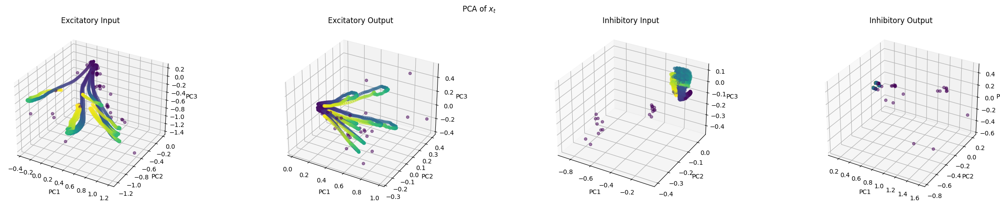

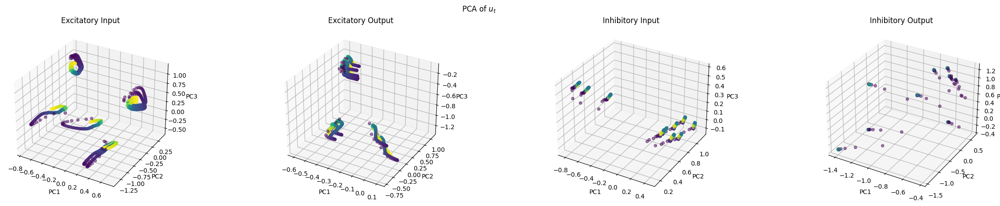

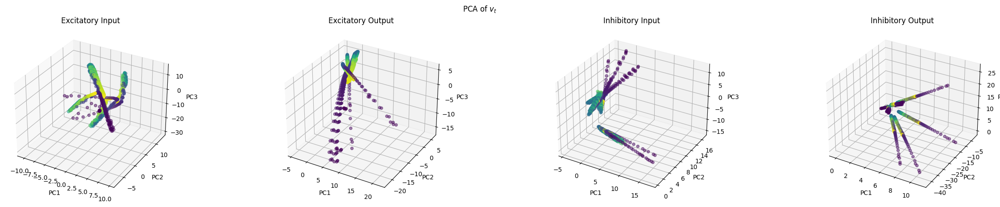

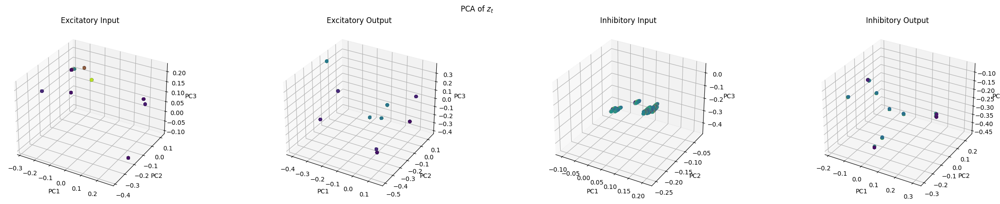

In [38]:
import matplotlib.pyplot as plt
import numpy as np
from mpl_toolkits.mplot3d import Axes3D

def pca_subplot(X_nit, x):
    # Create a figure with a 2x2 grid of 3D subplots
    fig, axes = plt.subplots(1, 4, subplot_kw={'projection': '3d'}, figsize=(30, 5))
    axes = axes.flatten()  # Flatten the 2x2 grid to easily iterate over it

    for j in range(4):
        for i in range(10):
            ax = axes[j]
            X_nit_sliced = X_nit[:, :, j*12:(j+1)*12]
            u, s, v = np.linalg.svd(X_nit_sliced[i])
            P = v[:,:3]
            Y = X_nit_sliced[i] @ P
            # 3d scatter plot
            ax.scatter(Y[:, 0], Y[:, 1], Y[:, 2], c=np.arange(Y.shape[0]), cmap='viridis', alpha=0.5)
            ax.set_xlabel('PC1')
            ax.set_ylabel('PC2')
            ax.set_zlabel('PC3')
            if j == 0:
                ax.set_title('Excitatory Input')
            elif j == 1:
                ax.set_title('Excitatory Output')
            elif j == 2:
                ax.set_title('Inhibitory Input')
            elif j == 3:
                ax.set_title('Inhibitory Output')
    fig.suptitle(f'PCA of {x}')
        
        

    # Adjust layout to make room for titles and labels
    plt.show()
    return fig  # Return the figure

# Assuming X_nit, U_nit, v_nit, z_nit are defined and properly processed for PCA

# Generate PCA subplots for each variable
fig_x = pca_subplot(X_nit, x=r'$x_t$')
fig_u = pca_subplot(U_nit, x=r'$u_t$')
fig_v = pca_subplot(v_nit, x=r'$v_t$')
fig_z = pca_subplot(z_nit, x=r'$z_t$')

# Save in PDF
from matplotlib.backends.backend_pdf import PdfPages
with PdfPages('1.4_PCA_08_Subplots.pdf') as pdf:
    # Text page with parameters
    text_page = plt.figure(figsize=(8, 10))
    text_page.clf()  # Clear the figure
    text_content = f"""
    PCA of Dynamic Variables

    Parameters:
    Input Size: {input_size}
    Sequence Length: {sequence_length}
    Hidden Size: {hidden_size}
    Number of Layers: {num_layers}
    Number of Classes: {num_classes}
    Batch Size: {batch_size}
    Number of Epochs: {num_epochs}
    Learning Rate: {learning_rate}
    Stride Number: {stride_number}
    """
    text_page.text(0.5, 0.5, text_content, ha='center', va='center', fontsize=12)
    pdf.savefig(text_page)
    plt.close(text_page)

    # Save figures
    for fig in [fig_x, fig_u, fig_v, fig_z]:
        pdf.savefig(fig)
        plt.close(fig)
